# **Transform Day time to night time images for Autonomous Drive**

## Assuming to develop new software around automated detection of cars, pedestrians at all conditions for autonomous drive. One major bottleneck is data collection under severe weather conditions, especially capturing night-time images. So this project is to generate night time equivalent images from daytime images, such that we have access to some outdoor images acquired at night and some at day, but no pairwise images are available.

### *Pairwise image means*: same view available in Day and Night times.


#Concepts of CycleGAN:

The model architecture is comprised of two generator models: one generator (Generator-A) for generating images for the first domain (Domain-A) and the second generator (Generator-B) for generating images for the second domain (Domain-B). Lets consider here, **Domain-A: Daytime**, **Domain-B: Nighttime**

* Generator-A -> Domain-A
* Generator-B -> Domain-B

The generator models perform image translation, meaning that the image generation process is conditional on an input image, specifically an image from the other domain. Generator-A takes an image from Domain-B as input and Generator-B takes an image from Domain-A as input.

* Domain-B -> Generator-A -> Domain-A
* Domain-A -> Generator-B -> Domain-B
Each generator has a corresponding discriminator model.

The first discriminator model (Discriminator-A) takes real images from Domain-A (daytime images) and generated images from Generator-A and predicts whether they are real or fake. The second discriminator model (Discriminator-B) takes real images from Domain-B (night-time images) and generated images from Generator-B and predicts whether they are real or fake.

* Domain-A -> Discriminator-A -> [Real/Fake]
* Domain-B -> Generator-A -> Discriminator-A -> [Real/Fake]
* Domain-B -> Discriminator-B -> [Real/Fake]
* Domain-A -> Generator-B -> Discriminator-B -> [Real/Fake]
The discriminator and generator models are trained in an adversarial zero-sum process, like normal GAN models.

The generators learn to better fool the discriminators and the discriminators learn to better detect fake images. Together, the models find an equilibrium during the training process.

Passing an image through both generators is called a cycle. Together, each pair of generator models are trained to better reproduce the original source image, referred to as cycle consistency.

* Domain-B -> Generator-A -> Domain-A -> Generator-B -> Domain-B
* Domain-A -> Generator-B -> Domain-B -> Generator-A -> Domain-A


**The project goal is to train such a 2 set Generator-Discriminator pair, to finally generate night-time images from day-time ones and quantify performance...**



# Install libraries and load data

In [ ]:
!pip install -U tensorflow-addons

     |████████████████████████████████| 1.1 MB 8.5 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
# The path below should point to the directory containing this notebook and the associated utility files
# Change it if necessary
os.chdir('data/training/')
!ls

c_model_AtoB.hdf5  discriminator_model_plot.png  g_model_BtoA.hdf5
c_model_BtoA.hdf5  generator_model_plot.png	 night
day		   g_model_AtoB.hdf5


## **Design functions for Generator-Discriminator pairs**: 


Step 1: Starting by stepwise defining all libraries and functions needed to generate the model and pre-process the data

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_84 (Conv2D)          (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu_15 (LeakyReLU)  (None, 128, 128, 64)      0         
                                                                 
 conv2d_85 (Conv2D)          (None, 128, 128, 128)     131200    
                                                                 
 instance_normalization_84 (  (None, 128, 128, 128)    256       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_16 (LeakyReLU)  (None, 128, 128, 128)     0         
                                                           

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


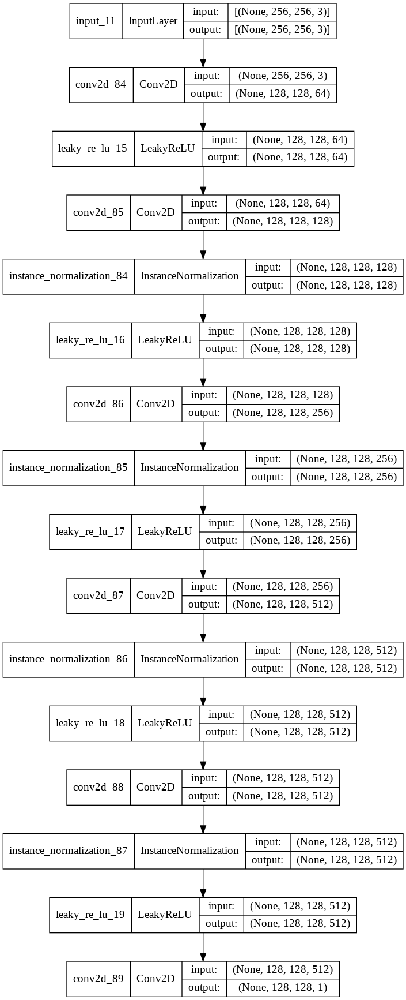

In [ ]:
#Step 1: Defining a Patchgan discriminator model
import tensorflow_addons as tfa
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import Model
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import BatchNormalization
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.utils import plot_model
import tensorflow as tf

# define the discriminator model
def define_discriminator(image_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_image = Input(shape=image_shape)
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
	d = LeakyReLU(alpha=0.2)(d) #Stride reduces shape of image
	# C128
	d = Conv2D(128, (4,4), padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	# define model
	model = Model(in_image, patch_out)
	# compile model
	model.compile(loss='mse', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
	return model

# define image shape
image_shape = (256,256,3)
# create the model
model = define_discriminator(image_shape)
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)

#############Note the final shape of the image patch=Patch size########################

In [ ]:
#Step 2: Generator Model
# generator a resnet block
def resnet_block(n_filters, input_layer):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# first layer convolutional layer
	g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
	g = InstanceNormalization()(g)
	g = Activation('relu')(g)
	# second convolutional layer
	g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
	g = InstanceNormalization()(g)
	# concatenate merge channel-wise with input layer
	g = Concatenate()([g, input_layer])
	return g

In [ ]:
# define the standalone generator model
def define_generator(image_shape=(256,256,3), n_resnet=9):
	# weight initialization
  init = RandomNormal(stddev=0.02)
  # image input
  in_image = Input(shape=image_shape)
  # c7s1-64
  g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
  g=InstanceNormalization()(g)
  g = Activation('relu')(g)
  # d128
  g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
  g=InstanceNormalization()(g)
  g = Activation('relu')(g)
  # d256
  g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
  g=InstanceNormalization()(g)
  g = Activation('relu')(g)
  # R256
  for _ in range(n_resnet):
    g = resnet_block(256, g)
  # u128
  g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
  g=InstanceNormalization()(g)
  g = Activation('relu')(g)
  # u64
  g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
  g=InstanceNormalization()(g)
  g = Activation('relu')(g)
  # c7s1-3
  g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
  g=InstanceNormalization()(g)
  out_image = Activation('sigmoid')(g)
  # define model
  model = Model(in_image, out_image)
  return model

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_168 (Conv2D)            (None, 256, 256, 64  9472        ['input_21[0][0]']               
                                )                                                                 
                                                                                                  
 instance_normalization_168 (In  (None, 256, 256, 64  128        ['conv2d_168[0][0]']             
 stanceNormalization)           )                                                          

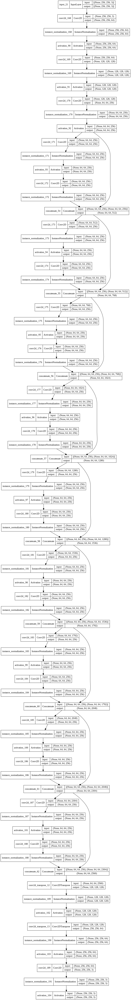

In [ ]:
# create the model
model = define_generator()
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Step 3: Define a composite model for updating generators by adversarial and cycle loss
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
	# ensure the model we're updating is trainable
	g_model_1.trainable = True
	# mark discriminator as not trainable
	d_model.trainable = False
	# mark other generator model as not trainable
	g_model_2.trainable = False
	# discriminator element
	input_gen = Input(shape=image_shape)
	gen1_out = g_model_1(input_gen)
	output_d = d_model(gen1_out)
	# identity element
	input_id = Input(shape=image_shape)
	output_id = g_model_1(input_id)
	# forward cycle
	output_f = g_model_2(gen1_out)
	# backward cycle
	gen2_out = g_model_2(input_id)
	output_b = g_model_1(gen2_out)
	# define model graph
	model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
	# define optimization algorithm configuration
	opt = Adam(lr=0.0002, beta_1=0.5)
	# compile model with weighting of least squares loss and L1 loss
	model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
	return model
  ############Notice no cross enytropy loss used here######################################

In [ ]:
#Step 4: All definitions together
# input shape
image_shape = (256,256,3)
# generator: A -> B
g_model_AtoB = define_generator(image_shape)
# generator: B -> A
g_model_BtoA = define_generator(image_shape)
# discriminator: A -> [real/fake]
d_model_A = define_discriminator(image_shape)
# discriminator: B -> [real/fake]
d_model_B = define_discriminator(image_shape)
# composite: A -> B -> [real/fake, A]
c_model_AtoB = define_composite_model(g_model_AtoB, d_model_B, g_model_BtoA, image_shape)
# composite: B -> A -> [real/fake, B]
c_model_BtoA = define_composite_model(g_model_BtoA, d_model_A, g_model_AtoB, image_shape)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
#Step 5: Helper functions to select real samples and generate fake samples

from random import randint
#write a function to generate 'n_samples' random integers in range (start,stop)
def randnums(start,stop,n_samples):
  ix=[]
  for i in range(n_samples):
    ix.append(randint(start,stop))
  ix=np.array(ix)
  return ix

In [ ]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
# choose random instances
  ix = randnums(0, dataset.shape[0]-1, n_samples)
  # retrieve selected images
  #print(ix,np.shape(dataset))
  X = dataset[ix]
  # generate 'real' class labels (1)
  y = np.ones((n_samples, patch_shape, patch_shape, 1))
  return X, y


In [ ]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, dataset, patch_shape):
	# generate fake instance
	X = g_model.predict(dataset)
	# create 'fake' class labels (0)
	y = np.zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

In [ ]:
# update image pool for fake images
import random
def update_image_pool(pool, images, max_size=50):
  selected = list()
  for image in images:
    if len(pool) < max_size:
    # stock the pool
      pool.append(image)
      selected.append(image)
    elif random.random() < 0.5:
      # use image, but don't add it to the pool
      selected.append(image)
    else:
      # replace an existing image and use replaced image
      ix = randint(0, len(pool)-1)
      print(ix,np.shape(pool))
      selected.append(pool[ix])
      pool[ix] = image
  return np.asarray(selected)


# All helper functions are now defined and then begins training!

Order of tasks:
* Update Generator-B (A->B)
* Update Discriminator-B
* Update Generator-A (B->A)
* Update Discriminator-A

In [ ]:
# train function for the cyclegan models
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB):

  # define properties of the training run
  n_epochs, n_batch, = 10, 1 #Keep n_batch as 1 for per image training. n_epochs can be changed
  # determine the output square shape of the discriminator
  n_patch = d_model_A.output_shape[1] #Notice n_patch depends on the discriminator output image size. This parameter can be changed for improvement.
  
  # prepare image pool for fakes
  poolA, poolB = list(), list()
  # calculate the number of batches per training epoch
  bat_per_epo = int(len(trainA) / n_batch)
  # calculate the number of training iterations
  n_steps = bat_per_epo * n_epochs
  # manually enumerate epochs
  print(n_steps)
  for i in range(n_steps):
  # select a batch of real samples
    X_realA, y_realA = generate_real_samples(trainA, n_batch, n_patch)
    X_realB, y_realB = generate_real_samples(trainB, n_batch, n_patch)
    
    # generate a batch of fake samples
    X_fakeA, y_fakeA = generate_fake_samples(g_model_BtoA, X_realB, n_patch)
    X_fakeB, y_fakeB = generate_fake_samples(g_model_AtoB, X_realA, n_patch)
    # update fakes from pool
    X_fakeA = update_image_pool(poolA, X_fakeA)
    X_fakeB = update_image_pool(poolB, X_fakeB)
    # update generator B->A via adversarial and cycle loss
    g_loss2, _, _, _, _ = c_model_BtoA.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
    # update discriminator for A -> [real/fake]
    dA_loss1 = d_model_A.train_on_batch(X_realA, y_realA)
    dA_loss2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
    # update generator A->B via adversarial and cycle loss
    g_loss1, _, _, _, _ = c_model_AtoB.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
    # update discriminator for B -> [real/fake]
    dB_loss1 = d_model_B.train_on_batch(X_realB, y_realB)
    dB_loss2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)
    # summarize performance
    print('>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1,dA_loss2, dB_loss1,dB_loss2, g_loss1,g_loss2))
  return(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA)

# **Train the model from scratch** 
# Loading the images DomainA-> Day, DomainB-> Night. 
using as many as 50 images to train the generator. More images will need more epochs and more train time. So limit training images to 30-50 images from each domain.
# Calling the train function to train on the images


In [ ]:
import numpy as np

import matplotlib as mpl

import IPython.display as display
import PIL.Image

from tensorflow.keras.preprocessing import image
import cv2

In [ ]:
trainA_array = []
for image_name in os.listdir('day'):
  # img = PIL.Image.open(os.path.join('day/', image_name))
  # img = image.img_to_array(img.resize((256,256)))
  img = image.img_to_array((PIL.Image.open(os.path.join('day/', image_name))).resize((256,256)))
  img = img/255
  trainA_array.append(img)

In [ ]:
trainB_array = []
for image_name in os.listdir('night'):
  img = image.img_to_array((PIL.Image.open(os.path.join('night/', image_name))).resize((256,256)))
  img = img/255
  trainB_array.append(img)

In [ ]:
# load a daytime images as trainA, nighttime images as train B (numpy lists)
trainA = np.array(trainA_array[:50])
trainB = np.array(trainB_array[:50])


In [ ]:
np.shape(trainA)

(50, 256, 256, 3)

# Next train the cycleGAN using the train function!

In [ ]:
# train CycleGAN
train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA,trainA,trainB)

500


>1, dA[0.811,8.725] dB[1.342,6.175] g[8.525,8.020]
>2, dA[3.693,11.138] dB[15.271,2.587] g[40.404,11.236]
>3, dA[2.454,2.833] dB[6.298,1.300] g[14.001,10.986]
>4, dA[1.222,8.710] dB[3.073,2.696] g[9.423,18.160]
>5, dA[3.106,7.744] dB[2.012,5.021] g[12.676,20.673]
>6, dA[1.934,5.307] dB[0.747,1.311] g[8.489,13.410]
>7, dA[0.349,2.243] dB[0.442,1.018] g[8.036,7.923]
>8, dA[0.570,0.562] dB[0.208,0.763] g[6.352,6.532]
>9, dA[0.367,0.714] dB[0.459,0.318] g[9.978,9.149]
>10, dA[0.334,0.427] dB[0.403,0.218] g[7.054,6.276]
>11, dA[0.242,0.292] dB[0.247,0.195] g[9.255,8.020]
>12, dA[0.215,0.306] dB[0.418,0.232] g[8.360,7.174]
>13, dA[0.181,0.345] dB[0.280,0.134] g[8.366,7.099]
>14, dA[0.169,0.165] dB[0.209,0.125] g[8.843,7.368]
>15, dA[0.210,0.214] dB[0.163,0.185] g[9.221,8.354]
>16, dA[0.213,0.201] dB[0.158,0.124] g[7.923,6.760]
>17, dA[0.193,0.196] dB[0.234,0.138] g[5.017,4.700]
>18, dA[0.217,0.190] dB[0.117,0.150] g[7.804,6.649]
>19, dA[0.186,0.149] dB[0.111,0.120] g[7.721,6.433]
>20, dA[0.1

(<keras.engine.functional.Functional at 0x7f6e94e42690>,
 <keras.engine.functional.Functional at 0x7f6e9a496190>)

In [ ]:
g_model_AtoB.save('g_model_AtoB.hdf5')
g_model_BtoA.save('g_model_BtoA.hdf5')
c_model_AtoB.save('c_model_AtoB.hdf5')
c_model_BtoA.save('c_model_BtoA.hdf5')

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
g_model_AtoB = load_model('g_model_AtoB.hdf5')
g_model_BtoA = load_model('g_model_BtoA.hdf5')
c_model_AtoB = load_model('c_model_AtoB.hdf5')
c_model_BtoA = load_model('c_model_BtoA.hdf5')

# Writting a test function to generate fake images for the test set
### Create Day->Night, Night->Day. versions separately
### Visualizing some images. 

In [ ]:
#Define a test function to generate day to night images
import matplotlib.pyplot as plt
def test(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB):
###################START CODE HERE#############################
  X_realA=trainA[randnums(0, trainA.shape[0]-1, 1)]
  X_fakeB=g_model_AtoB.predict(X_realA)
  X_realB=trainB[randnums(0, trainB.shape[0]-1, 1)]
  X_fakeA=g_model_BtoA.predict(X_realB)
###############################################################    
    ########First Day to night transformation
  print('Original Day Image is=\n')
  plt.imshow(np.squeeze(X_realA))
  plt.show()
  print('Fake Night image is=\n')
  plt.imshow(np.squeeze(X_fakeB))
  plt.show()
  #############Next Night to Day transformation
  print('Original Night Image is=\n')
  plt.imshow(np.squeeze(X_realB))
  plt.show()
  print('Fake Day image is=\n')
  plt.imshow(np.squeeze(X_fakeA))
  plt.show()


Original Day Image is=



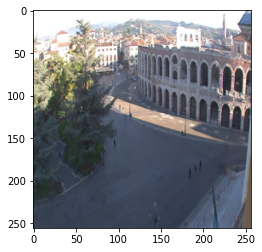

Fake Night image is=



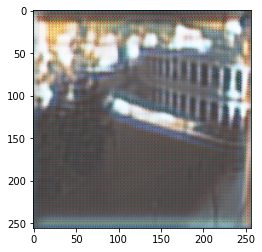

Original Night Image is=



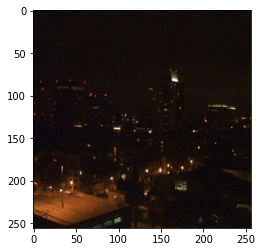

Fake Day image is=



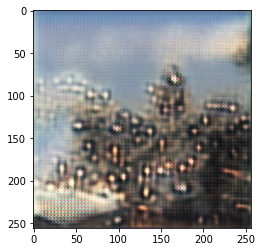

In [ ]:
##Calling the test function here
test(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB)

# Writting a function to generate a full cycle Day->night->Day
Using the template in the train function to start with Day image and plot the cyclic day image generated.

# Writting a function to quantify the error and similarity between the cycle generated image and original image (Day vs Generated Day)
Finding mse and structural similarity between real and fake images to gauge the quality of cycleGAN.



In [ ]:
from skimage.metrics import mean_squared_error as mse, structural_similarity as ssim

In [ ]:
#Function to compute similarity in Cycle images
def similarity_real_fake(real,fake):
  m = mse(real, fake)
  s = ssim(np.squeeze(real), np.squeeze(fake), multichannel=True)
  print('Original Image is=\n')
  plt.suptitle("MSE: %.2f, SSIM: %.2f" % (m, s))
  plt.imshow(np.squeeze(real))
  plt.show()
  print('Fake image is=\n')
  plt.imshow(np.squeeze(fake))
  plt.show()

In [ ]:
def test_Cycle(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB):

  # writting this function to call the similarity_real_fake function above and print it under each real->Generated image pair
  print('Day->night->Day full cycle\n')
  for i in range(3):
    X_realA=trainA[randnums(0, trainA.shape[0]-1, 1)]
    X_fakeB=g_model_AtoB.predict(X_realA)
    X_fakeA=g_model_BtoA.predict(X_fakeB)
    similarity_real_fake(X_realA,X_fakeA)

  print('night->Day->night full cycle\n')
  for i in range(3):
    X_realB=trainB[randnums(0, trainA.shape[0]-1, 1)]
    X_fakeA=g_model_AtoB.predict(X_realB)
    X_fakeB=g_model_BtoA.predict(X_fakeA)
    similarity_real_fake(X_realB,X_fakeB)


Day->night->Day full cycle

Original Image is=



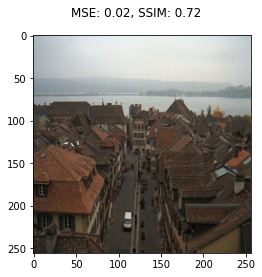

Fake image is=



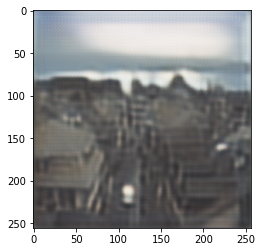

Original Image is=



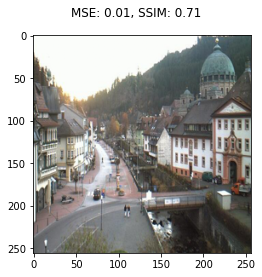

Fake image is=



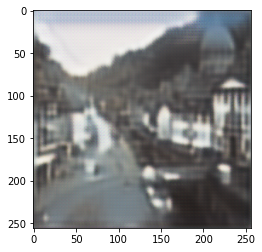

Original Image is=



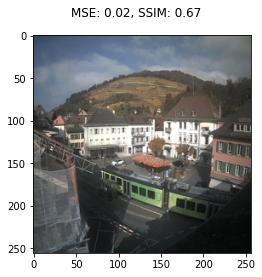

Fake image is=



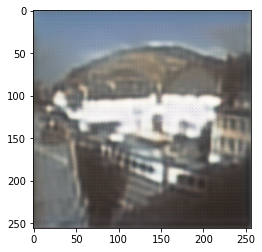

night->Day->night full cycle

Original Image is=



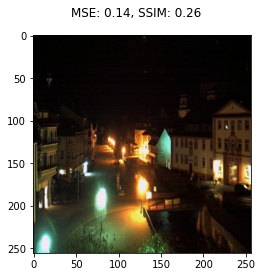

Fake image is=



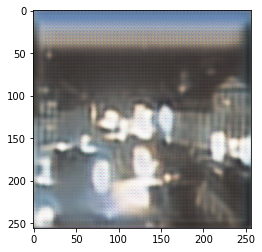

Original Image is=



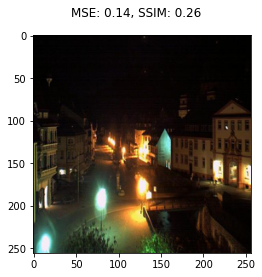

Fake image is=



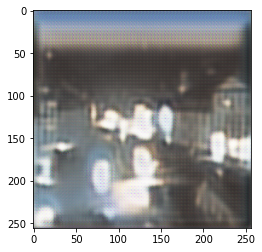

Original Image is=



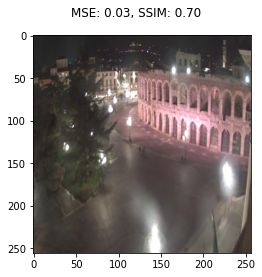

Fake image is=



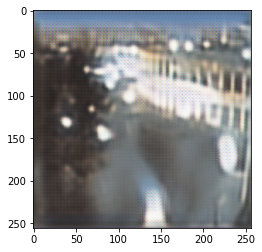

In [ ]:
# Calling the function test_Cycle(....)
test_Cycle(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB)

Original Day Image is=



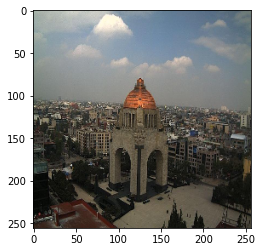

Fake Day image is=



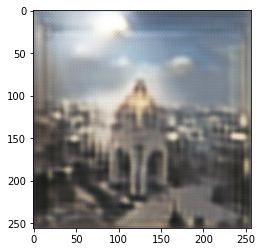

MSE= 0.026044395237637397 SSIM= 0.6168561295111501
Original Night Image is=



/usr/local/lib/python3.6/dist-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


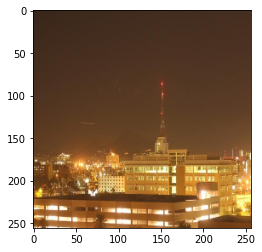

Fake Night image is=



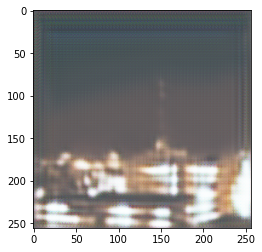

MSE= 0.03871575257560139 SSIM= 0.6702225063631798
Original Day Image is=



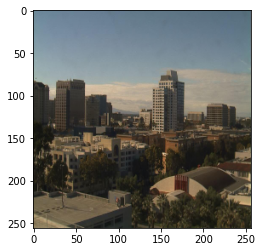

Fake Day image is=



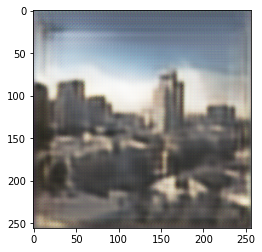

MSE= 0.025933950058090793 SSIM= 0.6803487947840673
Original Night Image is=



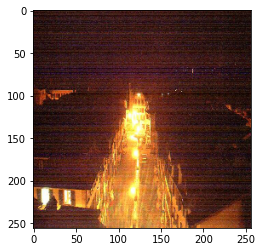

Fake Night image is=



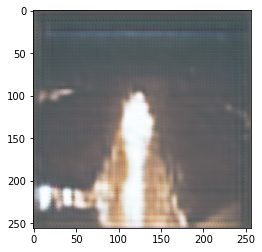

MSE= 0.06505909491823378 SSIM= 0.40081525626026143
Original Day Image is=



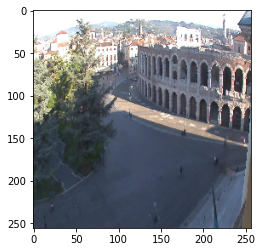

Fake Day image is=



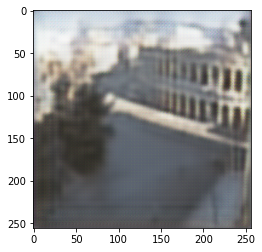

MSE= 0.013621779728374963 SSIM= 0.6665709305638648
Original Night Image is=



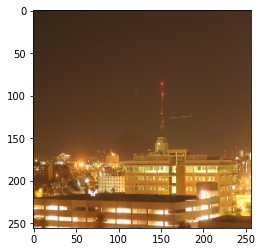

Fake Night image is=



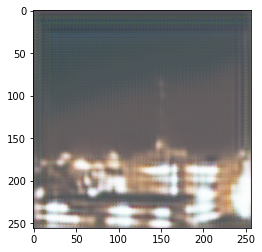

MSE= 0.039149986465152185 SSIM= 0.6698812886266213
Original Day Image is=



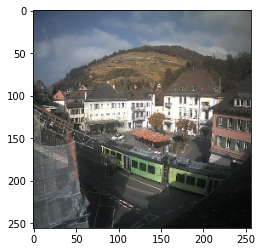

Fake Day image is=



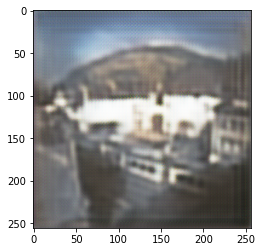

MSE= 0.023800958887375993 SSIM= 0.5825316738960171
Original Night Image is=



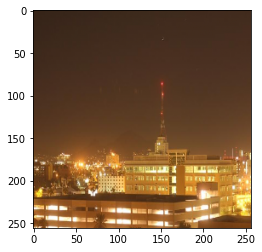

Fake Night image is=



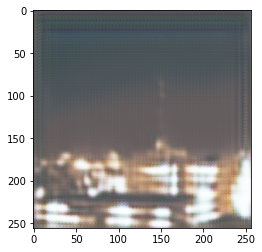

MSE= 0.0398679578890073 SSIM= 0.6639856671501164
Original Day Image is=



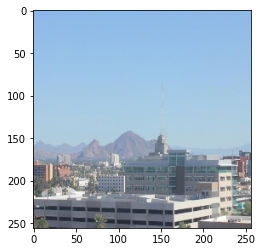

Fake Day image is=



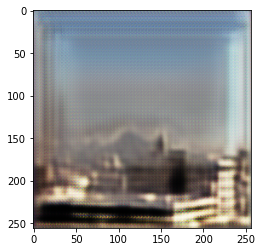

MSE= 0.04469692057312539 SSIM= 0.6612845299522272
Original Night Image is=



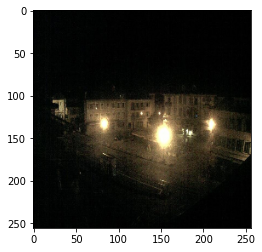

Fake Night image is=



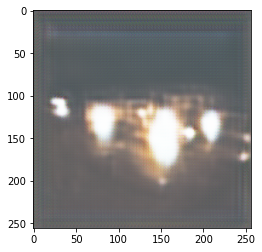

MSE= 0.13674561082642764 SSIM= 0.1670363316389368
Original Day Image is=



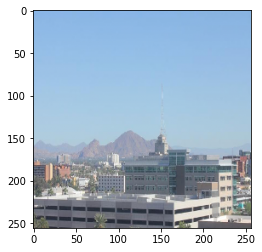

Fake Day image is=



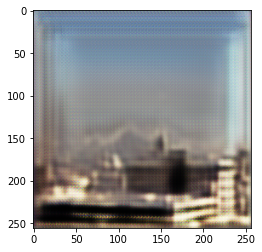

MSE= 0.04181704962408286 SSIM= 0.6629735242780143
Original Night Image is=



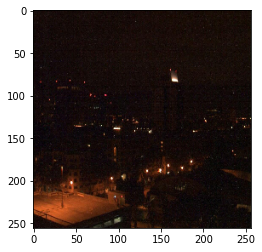

Fake Night image is=



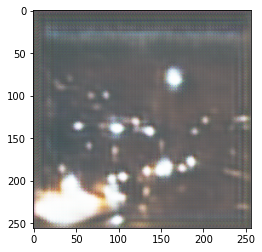

MSE= 0.1527281455809679 SSIM= 0.21277032668201426
Original Day Image is=



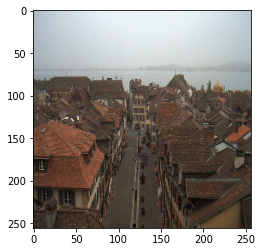

Fake Day image is=



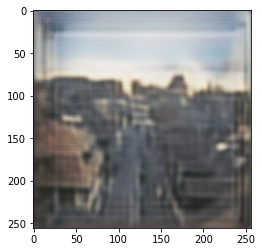

MSE= 0.018659282788257275 SSIM= 0.6450217736172726
Original Night Image is=



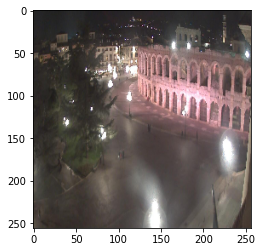

Fake Night image is=



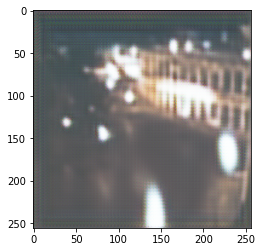

MSE= 0.017948636429231286 SSIM= 0.6976105260362452
Original Day Image is=



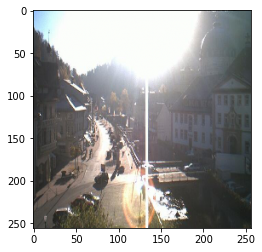

Fake Day image is=



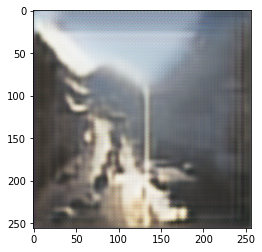

MSE= 0.02001238923946979 SSIM= 0.7294024037146104
Original Night Image is=



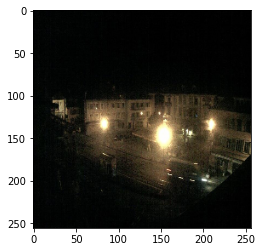

Fake Night image is=



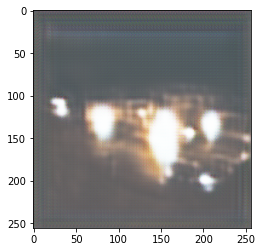

MSE= 0.1327685344714219 SSIM= 0.17549818136801576
Original Day Image is=



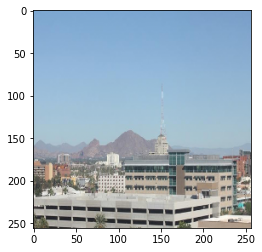

Fake Day image is=



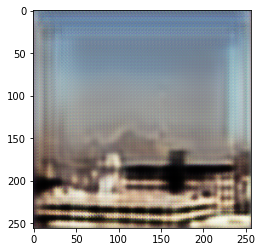

MSE= 0.03768178656410415 SSIM= 0.6570581942193675
Original Night Image is=



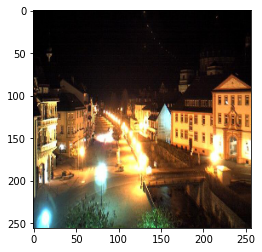

Fake Night image is=



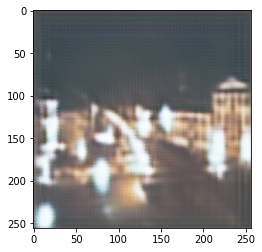

MSE= 0.05897069553789481 SSIM= 0.37272834957430834
Original Day Image is=



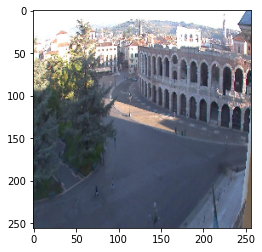

Fake Day image is=



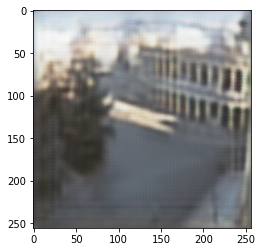

MSE= 0.012399292081870383 SSIM= 0.68638668050647
Original Night Image is=



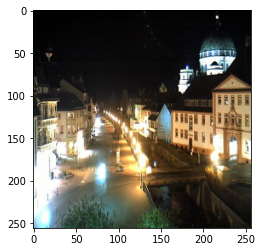

Fake Night image is=



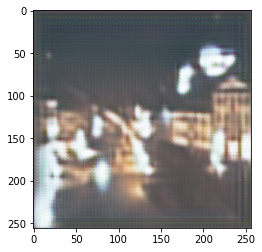

MSE= 0.048961468597213065 SSIM= 0.41433958343069194
Original Day Image is=



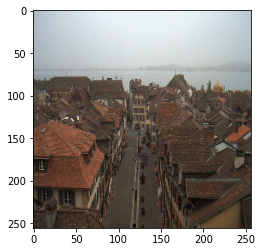

Fake Day image is=



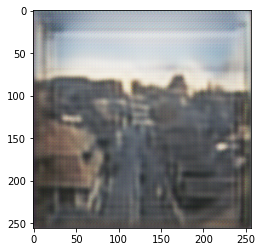

MSE= 0.018659280273747397 SSIM= 0.6450217767494261
Original Night Image is=



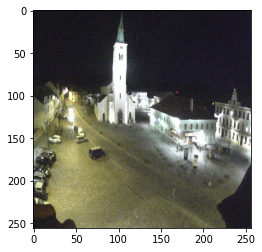

Fake Night image is=



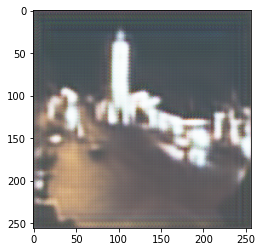

MSE= 0.029580294759540163 SSIM= 0.5935139859434049
Original Day Image is=



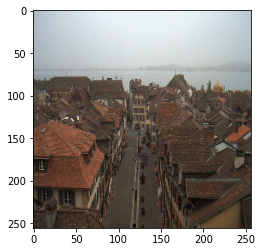

Fake Day image is=



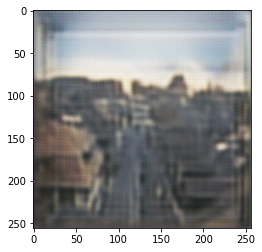

MSE= 0.018659282438766387 SSIM= 0.6450217769414248
Original Night Image is=



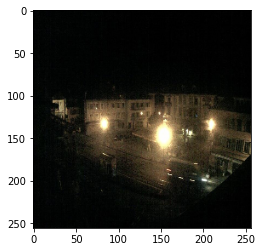

Fake Night image is=



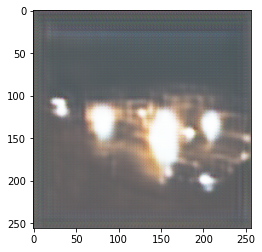

MSE= 0.13276853785970588 SSIM= 0.1754981807591205
Original Day Image is=



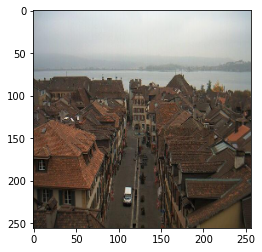

Fake Day image is=



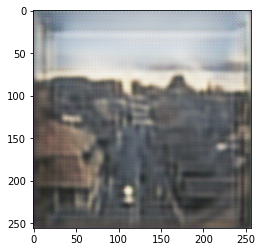

MSE= 0.019656378813157693 SSIM= 0.6330990773737488
Original Night Image is=



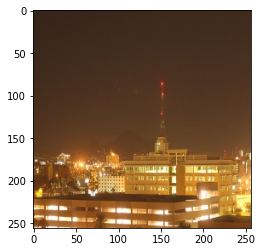

Fake Night image is=



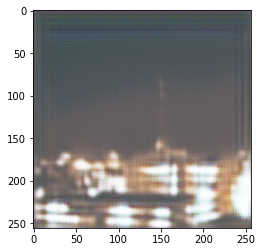

MSE= 0.04153876461947303 SSIM= 0.6573954568117664
Original Day Image is=



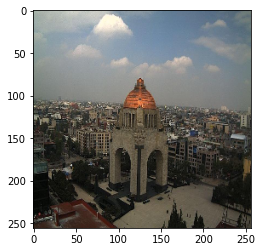

Fake Day image is=



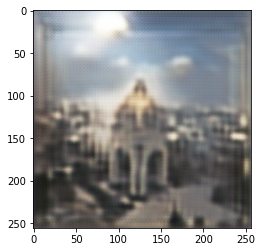

MSE= 0.026044395943951106 SSIM= 0.6168561277856455
Original Night Image is=



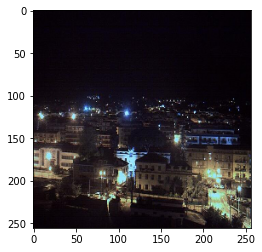

Fake Night image is=



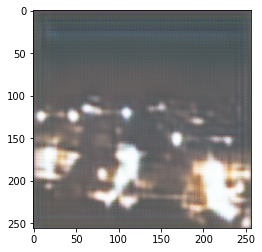

MSE= 0.10977569137920458 SSIM= 0.2547649338755868
Original Day Image is=



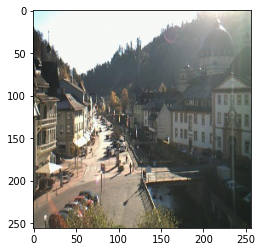

Fake Day image is=



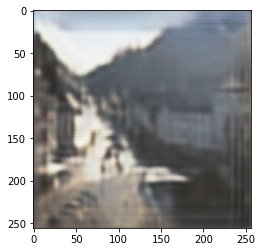

MSE= 0.014701413021399245 SSIM= 0.6710589244775642
Original Night Image is=



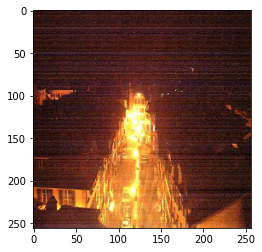

Fake Night image is=



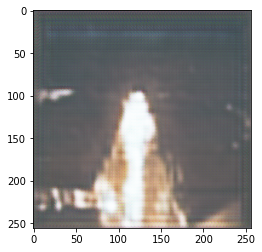

MSE= 0.06222796456860245 SSIM= 0.40898393819406786


In [ ]:
# Calling the function test_Cycle(....)
test_Cycle(g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, trainA,trainB)